In [1]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:35197")
client

<Client: 'tcp://127.0.0.1:35197' processes=7 threads=7, memory=32.00 GiB>

In [2]:
import xarray as xr
import pandas as pd
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 200)
import numpy as np
import os, numbers
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib.path as mpath
import cartopy
from scipy.stats import linregress, gaussian_kde, ttest_ind
from scipy.spatial import KDTree
from sklearn.metrics import mean_squared_error, r2_score, matthews_corrcoef
from shapely import Polygon
import statsmodels.api as sm

In [3]:
aus_albers = cartopy.crs.AlbersEqualArea(
    central_longitude=132,
    standard_parallels=[-18, -36],
    globe=cartopy.crs.Globe(ellipse='GRS80')
)


def get_point_indexes(dataset, points):
    # returns a list of indexes for locations in a specified xarray dataset
    try:
        x, y = np.meshgrid(dataset.lon.values, dataset.lat.values)
    except AttributeError:
        x, y = np.meshgrid(dataset.longitude.values, dataset.latitude.values)
    tree = KDTree(np.c_[y.ravel(), x.ravel()])
    _, i = tree.query(points)
    return i
    

def nrmse(observations, predictions):
    return np.sqrt(np.sum(((predictions - observations) ** 2) / observations) / observations.shape[0])


def norm_bias(observations, predictions):
    return (predictions.mean() - observations.mean()) / np.sqrt((observations**2).mean())


def norm_mean_bias(observations, predictions):
    return np.sum((predictions - observations) / observations) / observations.shape[0]


def global_stats(raw_data, source='ascat', cutoff_val=None):
    comparison_cols = [col for col in raw_data.columns if col.endswith('ws') and not col.startswith(source)]
    out_cols = ['count', 'r2', 'nrmse', 'bias', 'mean_bias']
    if cutoff_val is not None:
        out_cols.insert(1, 'MCC')
    df = pd.DataFrame(index=comparison_cols, columns=out_cols)
    df.index.name = f'{source}_ws'
    if cutoff_val is not None:
        df.index.name = f'{source}_ws >= {cutoff_val}'
    for col in comparison_cols:
        if cutoff_val is not None:
            df.loc[col, 'MCC'] = matthews_corrcoef(raw_data[f'{source}_ws'] >= cutoff_val, raw_data[col] >= cutoff_val)
            working_data = raw_data[raw_data[f'{source}_ws'] >= cutoff_val]
        else:
            working_data = raw_data
        df.loc[col, 'count'] = working_data.shape[0]
        df.loc[col, 'r2'] = linregress(working_data[f'{source}_ws'], working_data[col]).rvalue**2
        df.loc[col, 'nrmse'] = nrmse(working_data[f'{source}_ws'], working_data[col])
        df.loc[col, 'bias'] = norm_bias(working_data[f'{source}_ws'], working_data[col])
        df.loc[col, 'mean_bias'] = norm_mean_bias(working_data[f'{source}_ws'], working_data[col])
    return df
    

def qqplot(x, y, quantiles=None, method='nearest', ax=None, rug=False,
           rug_length=0.05, rug_kwargs=None, **kwargs):
    """
    Draw a quantile-quantile plot for `x` versus `y`.

    Egregiously stolen from https://stats.stackexchange.com/questions/403652/two-sample-quantile-quantile-plot-in-python

    Parameters
    ----------
    x, y : array-like
        One-dimensional numeric arrays.

    ax : matplotlib.axes.Axes, optional
        Axes on which to plot. If not provided, the current axes will be used.

    quantiles : int or array-like, optional
        Quantiles to include in the plot. This can be an array of quantiles, in
        which case only the specified quantiles of `x` and `y` will be plotted.
        If this is an int `n`, then the quantiles will be `n` evenly spaced
        points between 0 and 1. If this is None, then `min(len(x), len(y))`
        evenly spaced quantiles between 0 and 1 will be computed.

    interpolation : {‘linear’, ‘lower’, ‘higher’, ‘midpoint’, ‘nearest’}
        Specify the interpolation method used to find quantiles when `quantiles`
        is an int or None. See the documentation for numpy.quantile().

    rug : bool, optional
        If True, draw a rug plot representing both samples on the horizontal and
        vertical axes. If False, no rug plot is drawn.

    rug_length : float in [0, 1], optional
        Specifies the length of the rug plot lines as a fraction of the total
        vertical or horizontal length.

    rug_kwargs : dict of keyword arguments
        Keyword arguments to pass to matplotlib.axes.Axes.axvline() and
        matplotlib.axes.Axes.axhline() when drawing rug plots.

    kwargs : dict of keyword arguments
        Keyword arguments to pass to matplotlib.axes.Axes.scatter() when drawing
        the q-q plot.
    """
    # Get current axes if none are provided
    if ax is None:
        ax = plt.gca()

    if quantiles is None:
        quantiles = min(len(x), len(y))

    # Compute quantiles of the two samples
    if isinstance(quantiles, numbers.Integral):
        quantiles = np.linspace(start=0, stop=1, num=int(quantiles))
    else:
        quantiles = np.atleast_1d(np.sort(quantiles))
    x_quantiles = np.quantile(x, quantiles, method=method)
    y_quantiles = np.quantile(y, quantiles, method=method)

    # Draw the rug plots if requested
    if rug:
        # Default rug plot settings
        rug_x_params = dict(ymin=0, ymax=rug_length, c='gray', alpha=0.5)
        rug_y_params = dict(xmin=0, xmax=rug_length, c='gray', alpha=0.5)

        # Override default setting by any user-specified settings
        if rug_kwargs is not None:
            rug_x_params.update(rug_kwargs)
            rug_y_params.update(rug_kwargs)

        # Draw the rug plots
        for point in x:
            ax.axvline(point, **rug_x_params)
        for point in y:
            ax.axhline(point, **rug_y_params)

    # Draw the q-q plot
    ax.scatter(x_quantiles, y_quantiles, **kwargs)


def make_area_stats_df(raw_data, source='ascat'):
    model = ['barpa', 'ccam', 'era5n', 'barra']
    stat = ['count', 'r2', 'nrmse', 'bias', 'mean_bias']
    mcount = 0
    for m in model:
        if f'{m}_ws' in raw_data.columns:
            df_list = []
            x = raw_data.groupby(['xcut', 'ycut', f'{m}_idx', 'time_idx'], observed=True)[[f'{source}_ws', f'{m}_ws']].mean().reset_index()
            for name, grp in x.groupby(['xcut', 'ycut'], observed=True):
                df = pd.DataFrame(columns=[f'{m}_{y}' for y in stat], index=[0])
                df.loc[0, 'xcut'] = name[0]
                df.loc[0, 'ycut'] = name[1]
                df.loc[0, f'{m}_count'] = grp.shape[0]
                if grp.shape[0] >= 5:
                    for x in model:
                        df.loc[0, f'{m}_r2'] = linregress(grp[f'{source}_ws'], grp[f'{m}_ws']).rvalue**2
                        df.loc[0, f'{m}_nrmse'] = nrmse(grp[f'{source}_ws'], grp[f'{m}_ws'])
                        df.loc[0, f'{m}_bias'] = norm_bias(grp[f'{source}_ws'], grp[f'{m}_ws'])
                        df.loc[0, f'{m}_mean_bias'] = norm_mean_bias(grp[f'{source}_ws'], grp[f'{m}_ws'])
                df_list.append(df)
            if mcount == 0:
                adf = pd.concat(df_list, ignore_index=True).set_index(['xcut', 'ycut'])
            else:
                df = pd.concat(df_list, ignore_index=True).set_index(['xcut', 'ycut'])
                adf = adf.join(df)
            mcount += 1
    return adf.reset_index()


def create_plots(df, source='ascat', suptitle_suffix='all wind speeds'):
    for metric in [col for col in df.columns if col not in ['xcut', 'ycut']]:
        xgrid = np.arange(df.xcut.min(), df.xcut.max() + 25000, 25000).astype(int)
        ygrid = np.arange(df.ycut.min(), df.ycut.max() + 25000, 25000).astype(int)
        arr = np.empty((ygrid.shape[0], xgrid.shape[0])) * np.nan
        arr[np.nonzero(df.ycut.values.astype(int)[:, None] == ygrid)[1], 
            np.nonzero(df.xcut.values.astype(int)[:, None] == xgrid)[1]] = df[metric].values
        f, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection=aus_albers), layout='constrained')
        cmap = 'viridis'
        vmin, vmax = None, None
        extend = 'neither'
        if metric.endswith('r2'):
            vmin = 0
            vmax = 1
        elif metric.endswith('bias'):
            low_pc = np.nanpercentile(arr, 2)
            vmin = -0.2; vmax = 0.2; cmap = 'RdBu_r'
            if np.nanmax(arr) > 0.2:
                extend = 'both'
            else:
                extend = 'min'
        elif metric.endswith('count'):
            vmin = 0; vmax = np.nanpercentile(arr, 98); extend='max'
        else:
            vmin = 0; vmax = 1.2
            if np.nanmax(arr) > vmax:
                extend = 'max'
        
        im = ax.imshow(arr, origin='lower', vmin=vmin, vmax=vmax, cmap=cmap,
                       extent=(df.xcut.min(), df.xcut.max() + 25000, df.ycut.min(), df.ycut.max() + 25000), transform=aus_albers)
        ax.set_extent((acs_shply.bounds[0] + 2, acs_shply.bounds[2] - 2, acs_shply.bounds[1], acs_shply.bounds[3] + 2))
        ax.gridlines(lw=0.5, ls='--', color='#a0a0a0', draw_labels=['left', 'bottom'], ylocs=np.arange(-80, 0, 10), transform=cartopy.crs.PlateCarree())
        land_feature = cartopy.feature.NaturalEarthFeature(category='physical', name='land', scale='10m',
                                                           facecolor='#ffffcc', edgecolor='#808080')
        ax.add_feature(land_feature)
        ax.set_title(f'2016 - {source} vs {metric} - {suptitle_suffix}', fontsize=10)
        plt.colorbar(im, ax=ax, shrink=0.5, label=metric.split('_')[-1], extend=extend)


def plot_qq(raw_data, source='ascat', cutoff_val=10):
    for key in model_data.keys():
        f, ax = plt.subplots(figsize=(6, 6))
        ax.plot([0, 30], [0, 30], c='r', lw=0.5)
        ax.set_xlabel(f'{source}_ws (m/s)')
        qqplot(raw_data[f'{source}_ws'], raw_data[key], quantiles=100, ax=ax, s=6, label=key)
        ax.set_ylabel(f'{key} (m/s)')
        ax.set_title(f'Q-Q plot for ascat vs {"_".join(key.split("_")[:-1])} winds', fontsize=10)
    
        f, ax = plt.subplots(figsize=(6, 6))
        ax.plot([0, 30], [0, 30], c='r', lw=0.5)
        ax.set_xlabel('ascat_ws (m/s)')
        qqplot(raw_data.loc[raw_data[f'{source}_ws'] >= cutoff_val, f'{source}_ws'], 
               raw_data.loc[raw_data[f'{source}_ws'] >= cutoff_val, f'{key}'],
               quantiles=100, ax=ax, s=6, label=key)
        ax.set_ylabel(f'{key} (m/s)')
        ax.set_title(f'Q-Q plot for {source} vs {"_".join(key.split("_")[:-1])} winds - {source} > {cutoff_val} m/s', fontsize=10)


def plot_cdf(raw_data, source='ascat', cutoff_val=10):
    f, ax = plt.subplots(figsize=(6, 6), layout='constrained')
    hist_args = dict(bins=np.arange(0, 30.5, 0.5), histtype='step', density=True, cumulative=True)
    colors = ['#ff8000', '#ff00ff', '#0080ff', '#0000ff']
    for i, key in enumerate(model_data.keys()):
        ax.hist(raw_data.loc[raw_data[f'{source}_ws'] >= cutoff_val, f'{key}'], ec=colors[i], lw=2, label=key, **hist_args)
        #ax.hist(ascat_10plus[var], ec=colors[i], lw=2, label=var, **hist_args)
    ax.legend()
    ax.set_title(f'Distribution of winds - {source} >= {cutoff_val} m/s', fontsize=10)
    ax.set_xlabel('wind speed (m/s)')
    ax.set_ylabel('cumulative model proportion')

Load in all relevant data from their authoritative locations on gadi

In [4]:
# ACS SCHISM open boundary
open_bndy = pd.read_csv('/g/data/xv83/bxh595/boundary/bndy_all_20231120.csv')
acs_shply = Polygon((lon, lat) for lon, lat in open_bndy.values)
acs_mpl = mpath.Path([(lon, lat) for lon, lat in open_bndy.values])

model_data = {}

# BARRA2 courtesy of ob53
barra_uas = xr.open_mfdataset('/g/data/ob53/BARRA2/output/reanalysis/AUS-11/BOM/ERA5/historical/hres/BARRA-R2/v1/1hr/uas/v20231001/uas_AUS-11_ERA5_historical_hres_BOM_BARRA-R2_v1_1hr_2016*.nc', chunks=dict(time=72))
barra_vas = xr.open_mfdataset('/g/data/ob53/BARRA2/output/reanalysis/AUS-11/BOM/ERA5/historical/hres/BARRA-R2/v1/1hr/vas/v20231001/vas_AUS-11_ERA5_historical_hres_BOM_BARRA-R2_v1_1hr_2016*.nc', chunks=dict(time=72))
model_data['barra_ws'] = np.sqrt(barra_uas.uas**2 + barra_vas.vas**2)

# BARPA - py18
barpa_uas = xr.open_dataset('/g/data/py18/BARPA/output/CMIP6/DD/AUS-15/BOM/ERA5/evaluation/r1i1p1f1/BARPA-R/v1-r1/1hr/uas/v20231001/uas_AUS-15_ERA5_evaluation_r1i1p1f1_BOM_BARPA-R_v1-r1_1hr_201601-201612.nc', chunks=dict(time=72))
barpa_vas = xr.open_dataset('/g/data/py18/BARPA/output/CMIP6/DD/AUS-15/BOM/ERA5/evaluation/r1i1p1f1/BARPA-R/v1-r1/1hr/vas/v20231001/vas_AUS-15_ERA5_evaluation_r1i1p1f1_BOM_BARPA-R_v1-r1_1hr_201601-201612.nc', chunks=dict(time=72))
model_data['barpa_ws'] = np.sqrt(barpa_uas.uas ** 2 + barpa_vas.vas ** 2)

# CCAM - hq89
ccam_uas = xr.open_dataset('/g/data/hq89/CCAM/output/CMIP6/DD/AUS-10i/CSIRO/ERA5/evaluation/r1i1p1f1/CCAM-v2203-SN/v1-r1/1hr/uas/v20231206/uas_AUS-10i_ERA5_evaluation_r1i1p1f1_CSIRO_CCAM-v2203-SN_v1-r1_1hr_20160101-20161231.nc', chunks=dict(time=72))
ccam_vas = xr.open_dataset('/g/data/hq89/CCAM/output/CMIP6/DD/AUS-10i/CSIRO/ERA5/evaluation/r1i1p1f1/CCAM-v2203-SN/v1-r1/1hr/vas/v20231206/vas_AUS-10i_ERA5_evaluation_r1i1p1f1_CSIRO_CCAM-v2203-SN_v1-r1_1hr_20160101-20161231.nc', chunks=dict(time=72))
model_data['ccam_ws'] = np.sqrt(ccam_uas.uas**2 + ccam_vas.vas**2)

# ERA5_native - rt52
era5n_u10 = xr.open_mfdataset('/g/data/rt52/era5/single-levels/reanalysis/10u/2016/*.nc', chunks=dict(time=72))
era5n_v10 = xr.open_mfdataset('/g/data/rt52/era5/single-levels/reanalysis/10v/2016/*.nc', chunks=dict(time=72))
era5n_ws = np.sqrt(era5n_u10.u10**2 + era5n_v10.v10**2)
model_data['era5n_ws'] = era5n_ws.rename({'latitude': 'lat', 'longitude': 'lon'})

Take screened ascat data and add model data values at locations/times

See ascat_data_collation.ipynb for details on ascat download and curation

In [ ]:
ascat = pd.read_feather('/g/data/xv83/bxh595/ascat/ascat_2016_screened.fth')
ascat = ascat.sort_values(by='time')
ascat = ascat[ascat.time.round('H') < '2017']
ascat = ascat.rename(columns=dict(wind_speed='ascat_ws'))
ascat['time_rnd'] = ascat['time'].round('H')
ascat['time_idx'] = ((ascat['time_rnd'] - ascat['time_rnd'].iloc[0]).dt.total_seconds() / 3600).astype(int)

for key, val in model_data.items():
    ascat[key] = val.sel(lat=xr.DataArray(ascat.lat.values, dims='z'), 
                         lon=xr.DataArray(ascat.lon.values, dims="z"), 
                         time=xr.DataArray(ascat.time.values, dims="z"), method='nearest')
    ascat[f'{key.split("_")[0]}_idx'] = get_point_indexes(val, ascat[['lat', 'lon']].values)

ascat.reset_index(drop=True).to_feather('/g/data/xv83/bxh595/ascat/ascat_2016_model_ws.fth')

In [5]:
ascat = pd.read_feather('/g/data/xv83/bxh595/ascat/ascat_2016_model_ws.fth')
ascat

,time,lon,lat,ascat_ws,wvc_quality_flag,sat,x,y,xcut,ycut,barra_ws,ccam_ws,era5n_ws,time_rnd,barra_idx,ccam_idx,era5n_idx,time_idx,barpa_ws,barpa_idx
0,2015-12-31 23:39:20,139.93826,-8.36526,6.75,32768,metopa,9.053079e+05,-9.011842e+05,900000.0,-925000.0,6.114747,7.785901,5.996081,2016-01-01 00:00:00,488450,409267,567200,0,5.700446,227997
1,2015-12-31 23:39:20,139.83578,-8.32518,7.03,32768,metopa,8.938977e+05,-8.961927e+05,875000.0,-900000.0,5.985959,7.904043,5.978745,2016-01-01 00:00:00,488449,410195,567199,0,5.725046,227996
2,2015-12-31 23:39:20,139.74829,-8.29587,7.26,32768,metopa,8.841189e+05,-8.924618e+05,875000.0,-900000.0,5.323215,8.071474,5.978745,2016-01-01 00:00:00,489530,410194,567199,0,5.725046,227996
3,2015-12-31 23:39:20,139.65584,-8.27892,7.62,32768,metopa,8.736909e+05,-8.900204e+05,850000.0,-900000.0,5.255642,8.071474,5.978745,2016-01-01 00:00:00,489529,410194,567199,0,5.651488,227995
4,2015-12-31 23:39:20,139.56990,-8.26964,8.22,32768,metopa,8.639535e+05,-8.884476e+05,850000.0,-900000.0,5.490405,8.010128,5.697670,2016-01-01 00:00:00,489528,410193,567198,0,5.651488,227995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12443729,2016-12-31 23:29:58,138.88448,-38.37762,6.81,0,metopb,6.062730e+05,-4.212401e+06,600000.0,-4225000.0,7.847297,4.907858,7.858106,2016-12-31 23:00:00,193054,130557,741436,8783,6.984993,76475
12443730,2016-12-31 23:29:58,139.01698,-38.41031,6.66,0,metopb,6.177323e+05,-4.216629e+06,600000.0,-4225000.0,7.847321,4.845206,7.858106,2016-12-31 23:00:00,193055,130558,741436,8783,6.987340,76476
12443731,2016-12-31 23:29:58,148.76768,-40.28611,3.37,32768,metopb,1.445712e+06,-4.500356e+06,1425000.0,-4525000.0,4.403479,5.489818,4.377443,2016-12-31 23:00:00,174750,113005,751555,8783,6.183962,67215
12443732,2016-12-31 23:29:58,147.65941,-40.15488,4.10,32768,metopb,1.352406e+06,-4.474000e+06,1350000.0,-4475000.0,4.543746,2.896472,4.288984,2016-12-31 23:00:00,175822,113923,751551,8783,3.815733,67985


In [6]:
global_stats(ascat).astype(float).round(4)

,count,r2,nrmse,bias,mean_bias
ascat_ws,,,,,
barra_ws,12443734.0,0.8289,0.5185,-0.0252,-0.0256
ccam_ws,12443734.0,0.5835,0.7906,-0.0629,-0.0412
era5n_ws,12443734.0,0.8692,0.4496,-0.0588,-0.0639
barpa_ws,12443734.0,0.5076,0.9320,-0.0243,0.0085


In [7]:
global_stats(ascat, cutoff_val=10).astype(float).round(4)

,count,MCC,r2,nrmse,bias,mean_bias
ascat_ws >= 10,,,,,,
barra_ws,2455630.0,0.7835,0.7124,0.3728,-0.0311,-0.0323
ccam_ws,2455630.0,0.5956,0.3182,0.7474,-0.1219,-0.1210
era5n_ws,2455630.0,0.7875,0.7069,0.3995,-0.0655,-0.0660
barpa_ws,2455630.0,0.5732,0.3489,0.7407,-0.0886,-0.0893


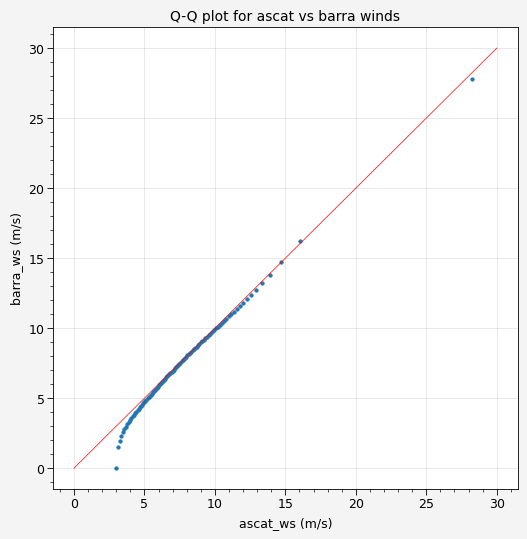

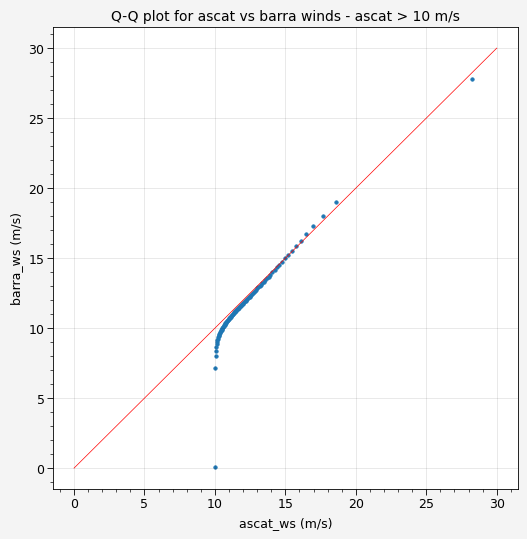

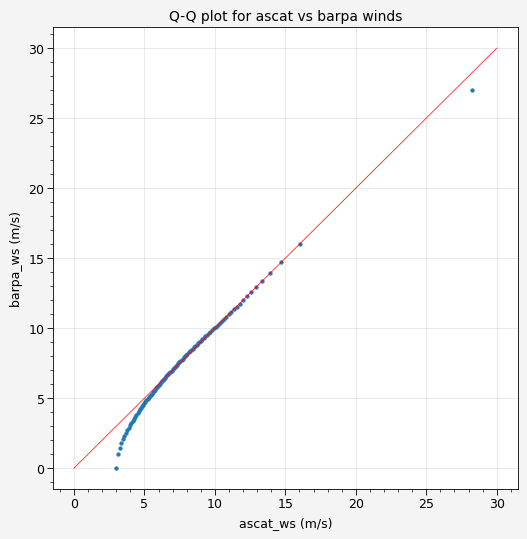

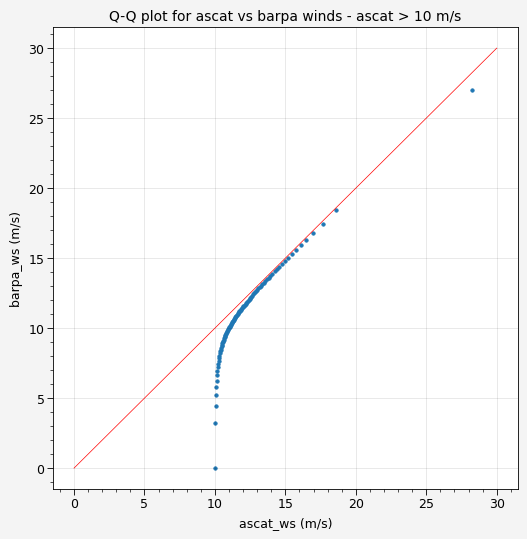

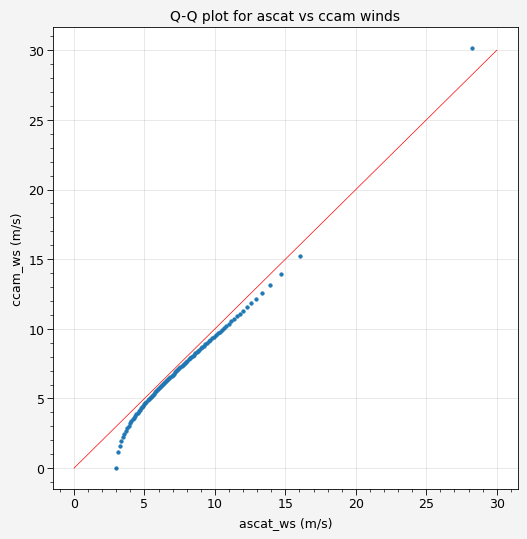

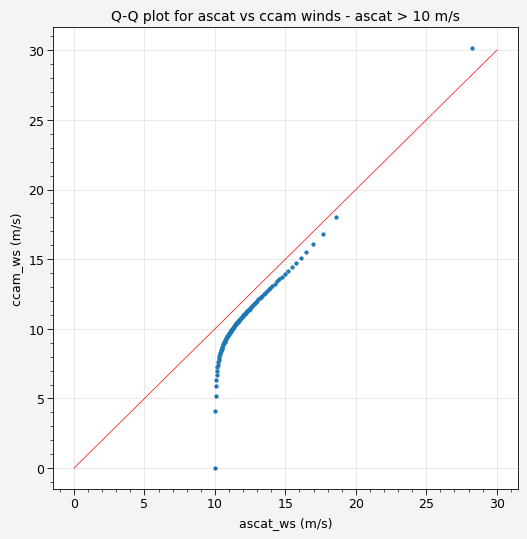

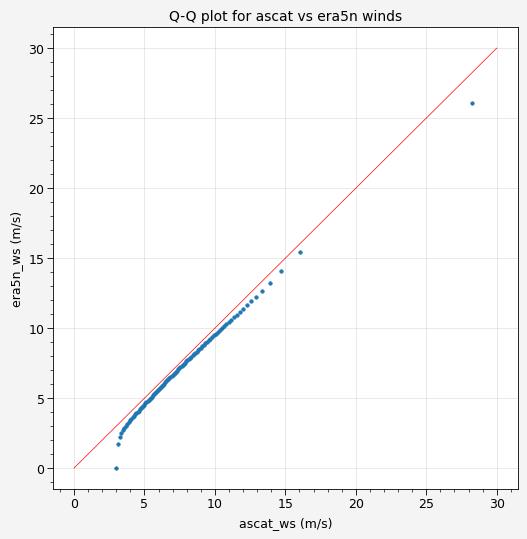

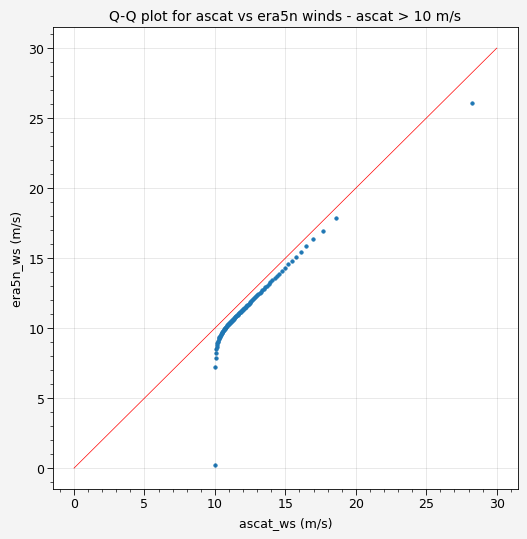

In [8]:
plot_qq(ascat)

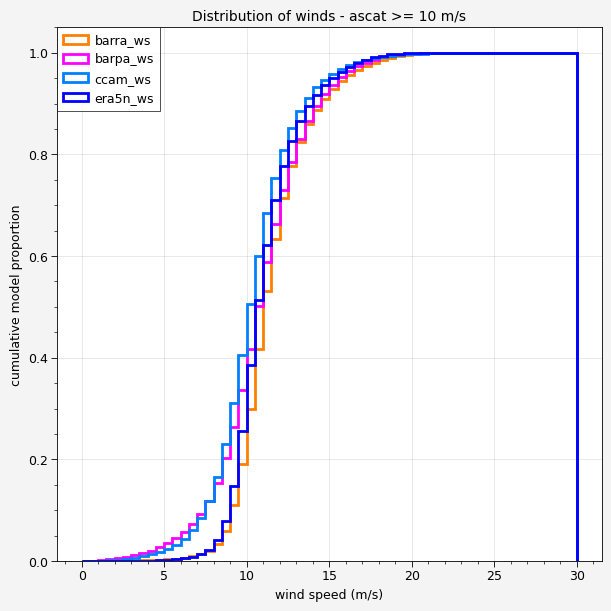

In [9]:
plot_cdf(ascat)

In [10]:
ascat_stats = make_area_stats_df(ascat)
stats_10plus = make_area_stats_df(ascat[ascat.ascat_ws >= 10])

/jobfs/115963311.gadi-pbs/ipykernel_3803653/1390140615.py:165: RuntimeWarning: invalid value encountered in multiply
  arr = np.empty((ygrid.shape[0], xgrid.shape[0])) * np.nan
/jobfs/115963311.gadi-pbs/ipykernel_3803653/1390140615.py:168: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection=aus_albers), layout='constrained')


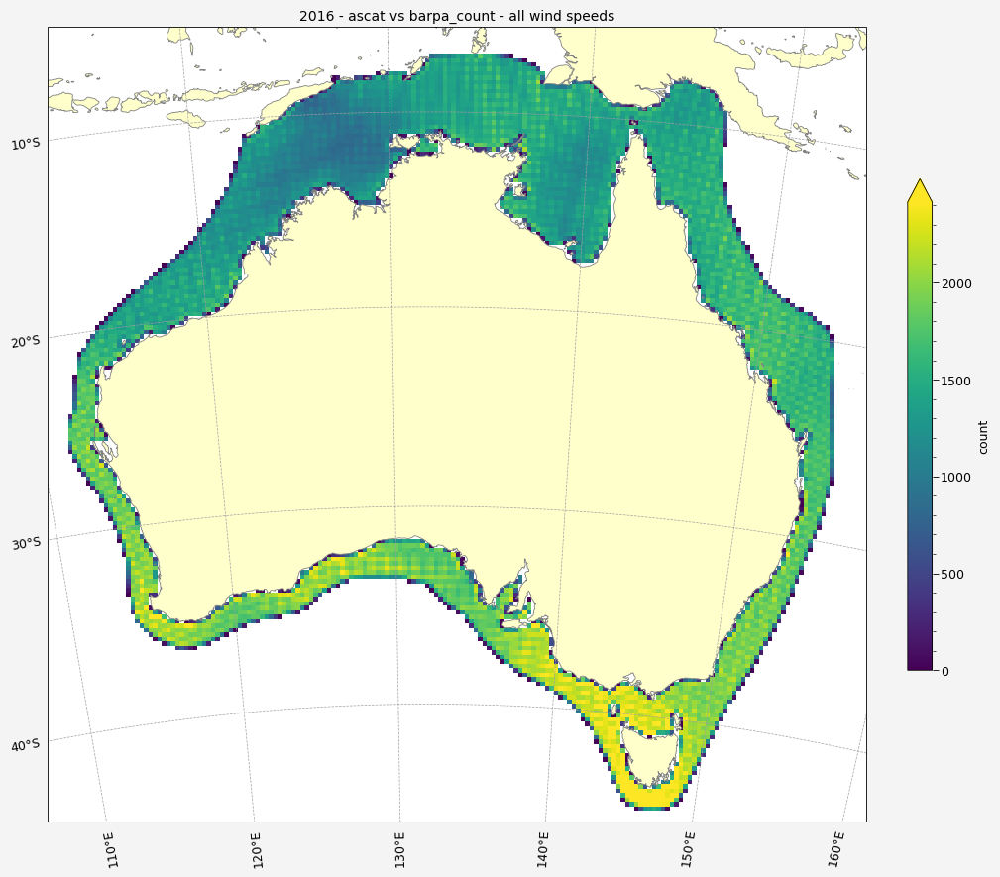

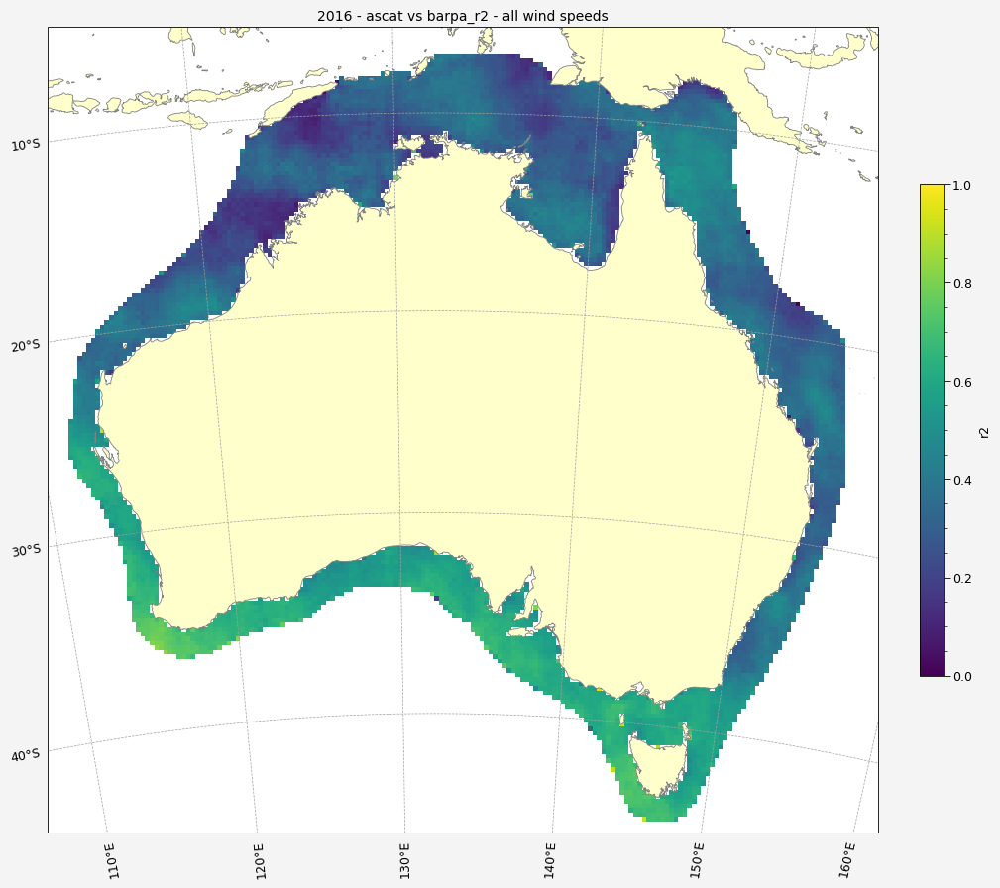

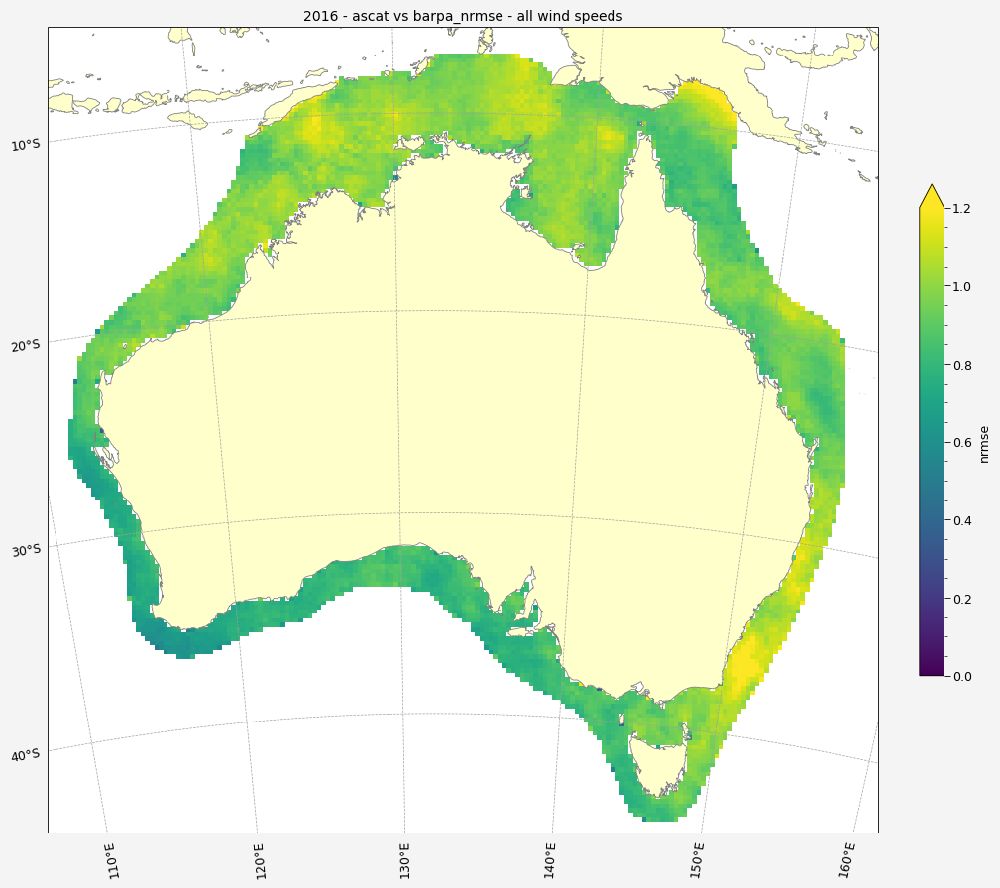

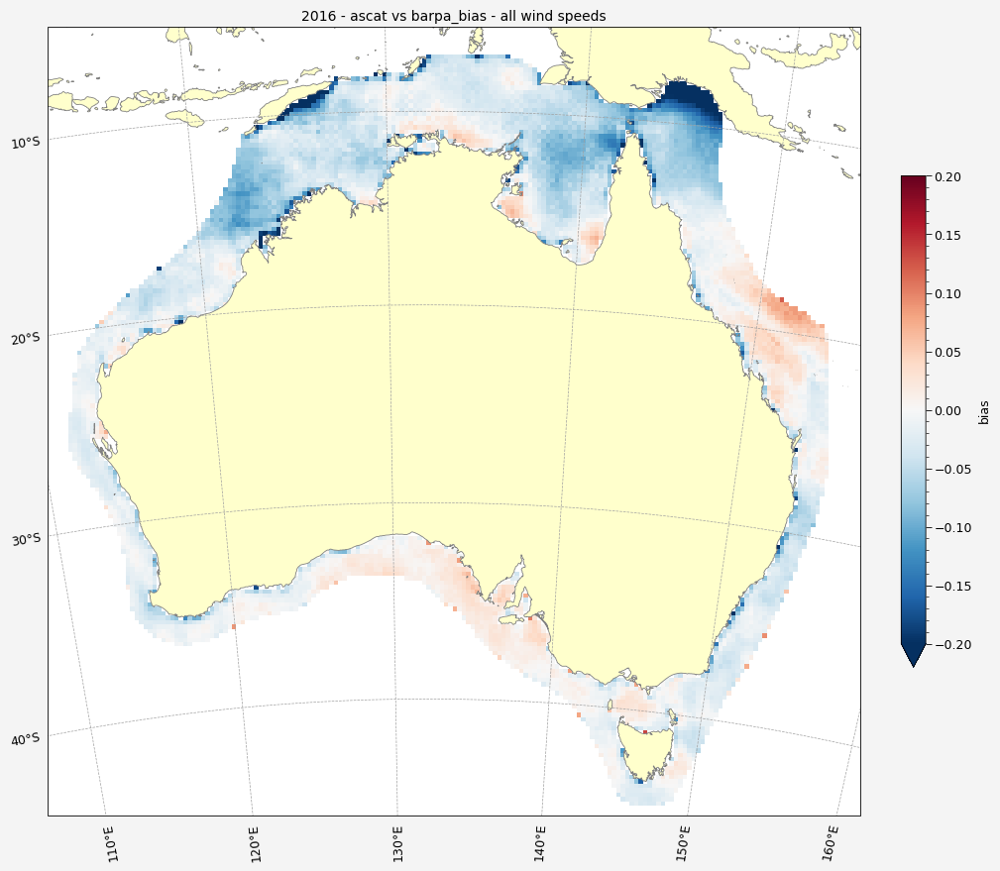

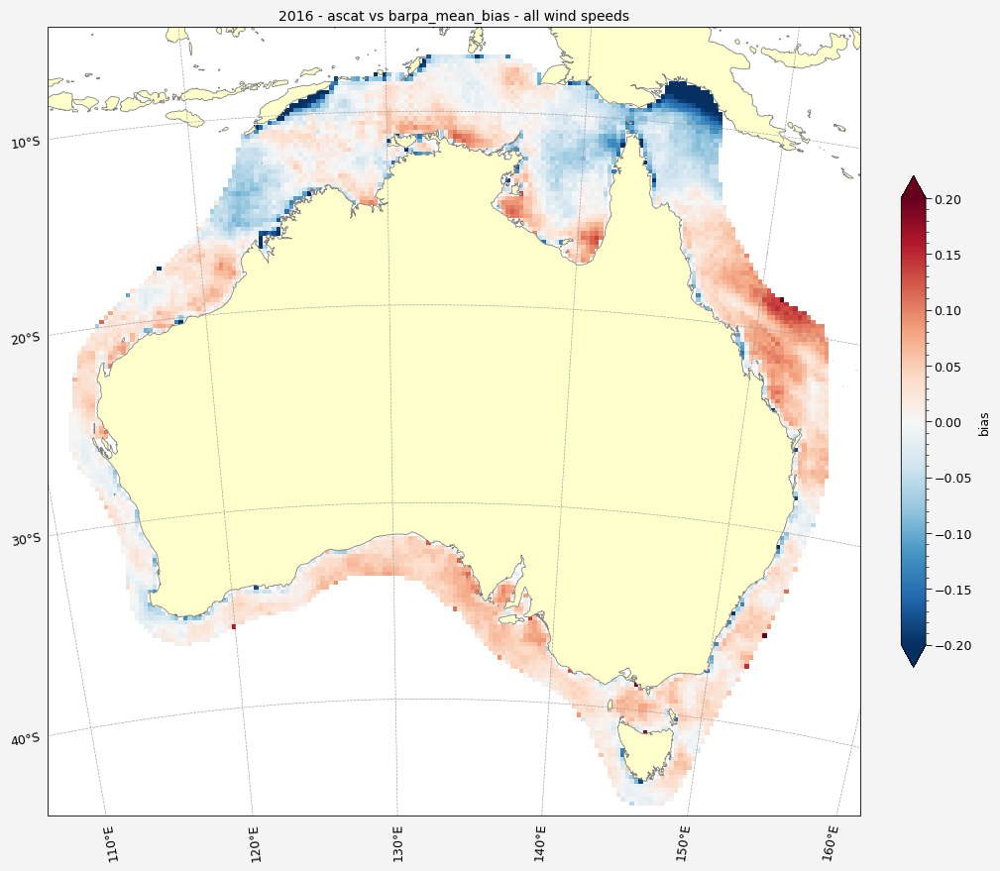

...

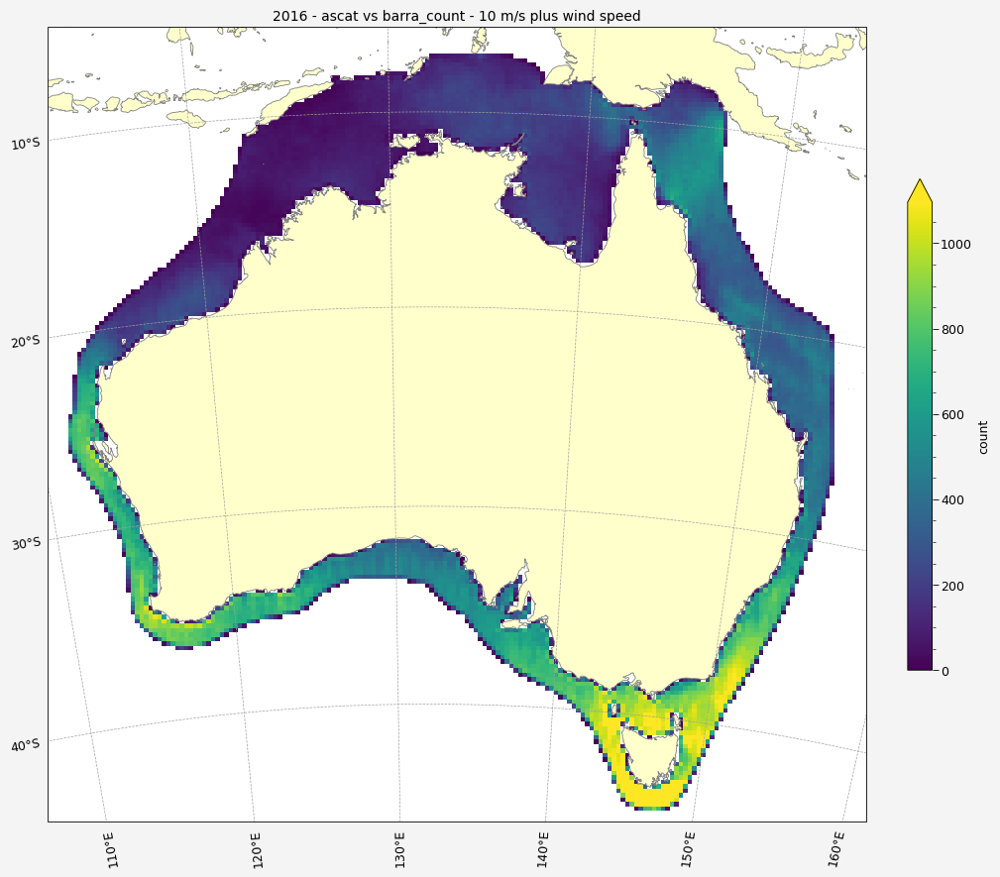

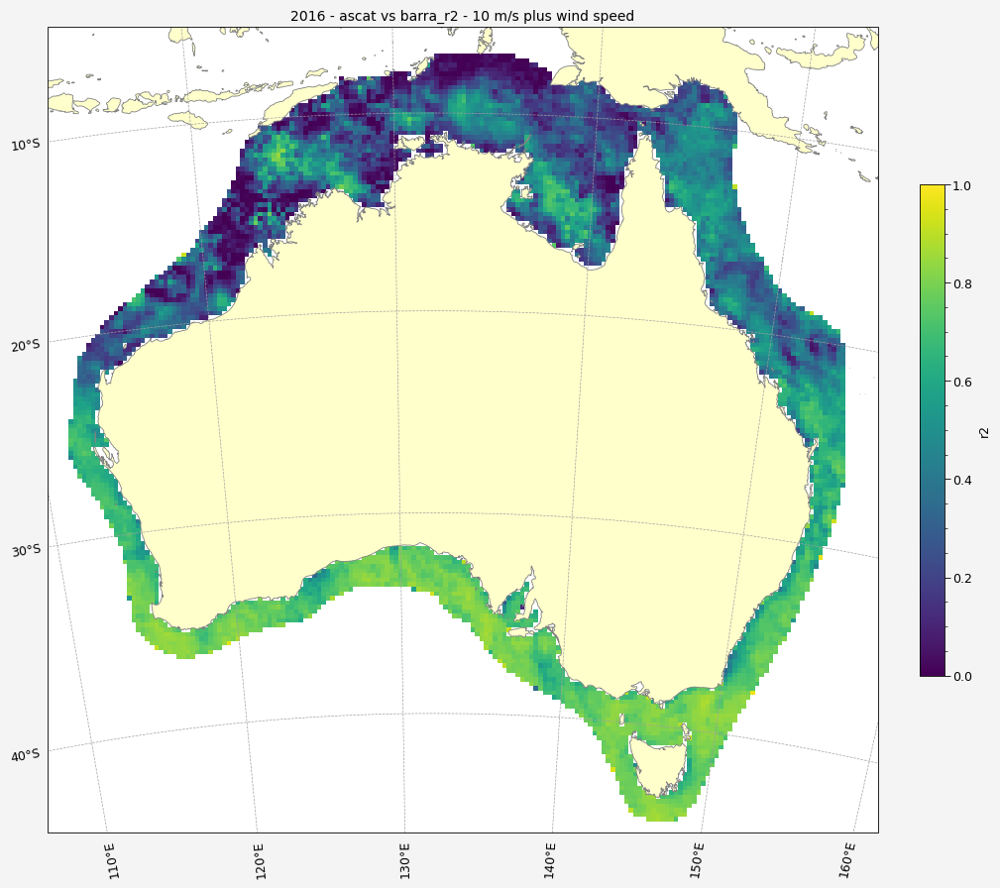

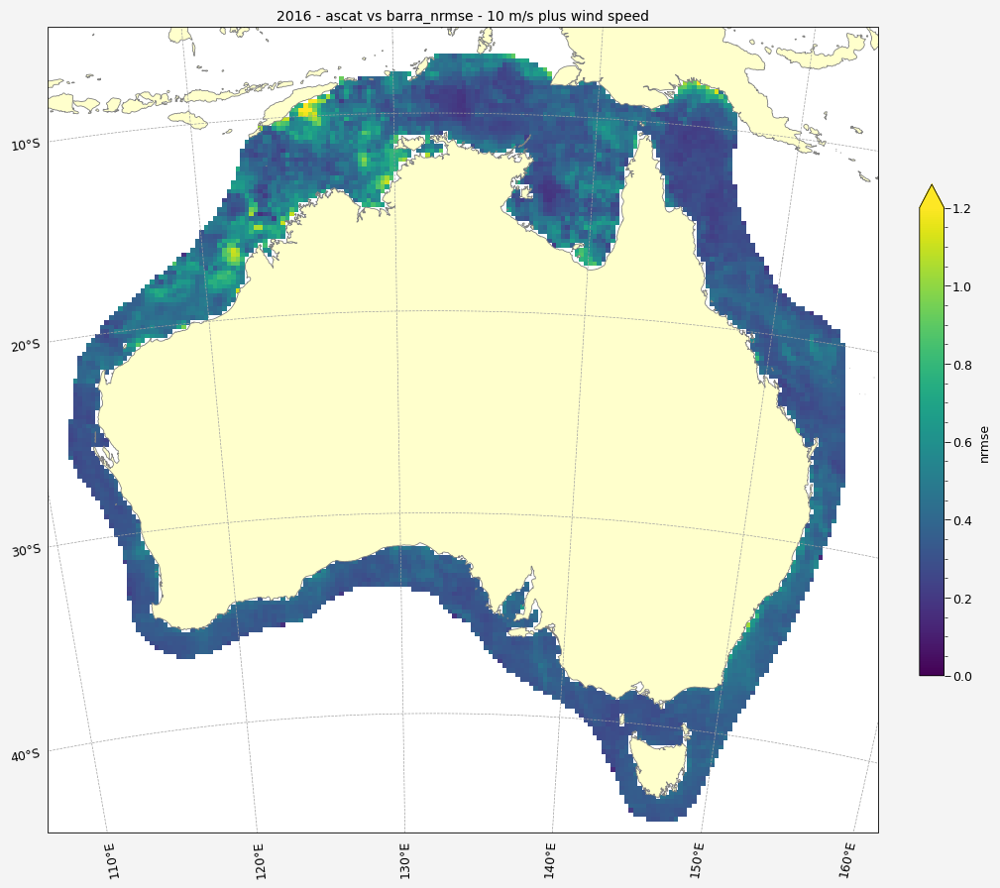

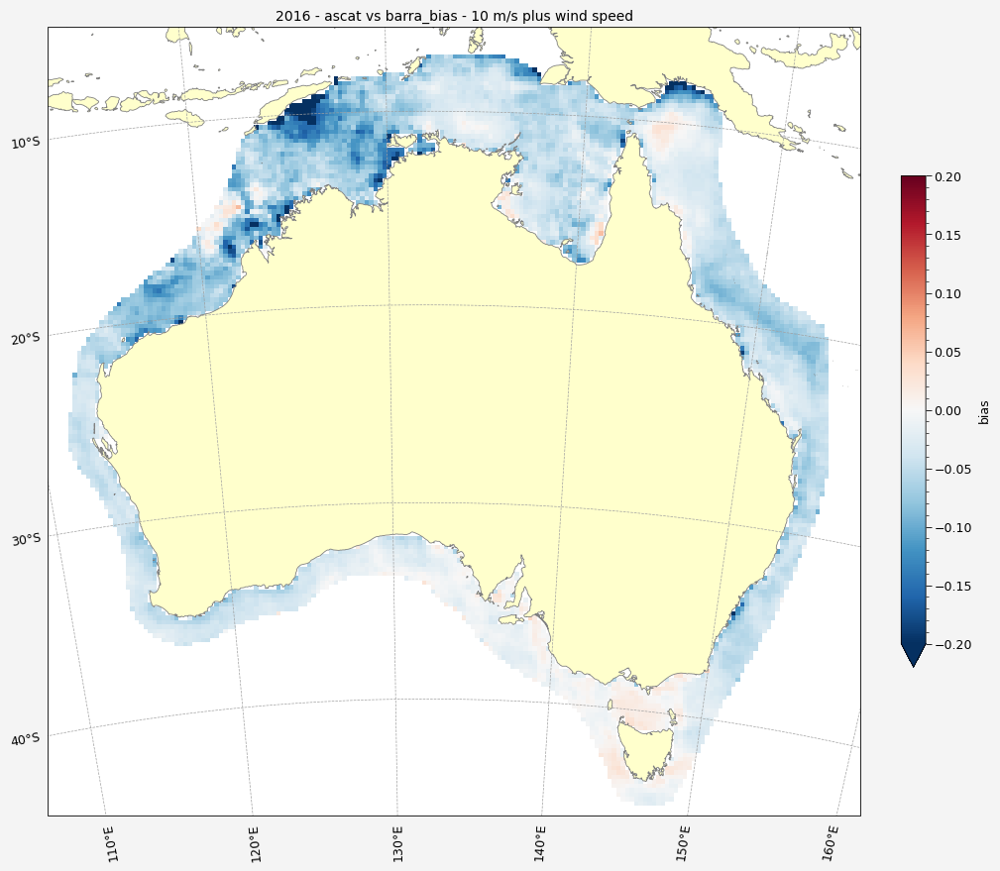

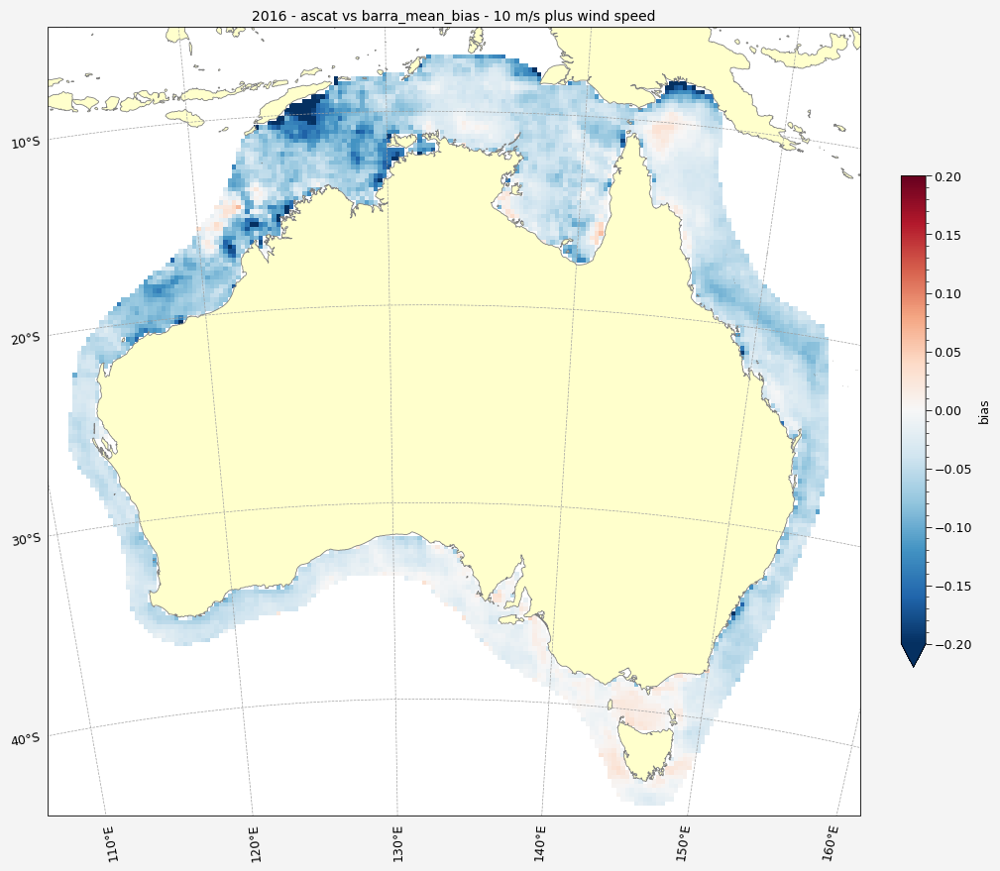

In [11]:
create_plots(ascat_stats)
create_plots(stats_10plus, suptitle_suffix='10 m/s plus wind speed')